In this project I will utilize the power of python and its libraries to analyze 120 year of olympic history in a dataset containing historical data on on the modern Olympic Games, from Athens 1896 to Rio 2016. Each row corresponds to an individual athlete competing in an individual event, including the athlete's name, sex, age, height, weight, country, and medal, and the event's name, sport, games, year, and city.


RECOMMENDED ANALYSIS:

1) Analyze and visualize the % of athletes who were female over time.
2) Compare and contrast the summer and the winter games...

    a) How many athletes compete?

    b) How many countries compete?

    c) How many events are there?
3) Analyze and visualize country-level trends...

    a) Which countries send the most athletes to the olympics?

    b) Do they also tend to win the most medals?
    
    c) How have these trends changed over time?


I will start by importing some neccesary libraries for mathematical computations, reading data into a dataframe, data manipulation, navigation of file directories, and data visualization. I will also set some options to display my visuals in a certain way, as well as display all of my rows and columns.

###### **Importing libraries and setting options**

In [1]:
import numpy as np
import pandas as pd 
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
import matplotlib.pyplot as plt
from matplotlib import style 
%matplotlib inline
style.use("ggplot") 
import seaborn as sns
sns.set_style("darkgrid")
import os 

Now I am going to search my computer to find the files that I need for this project. I first need to find out what directory I am currently in.

###### **Searching my current working directory**

In [2]:
os.getcwd()

'c:\\Users\\mjaso\\OneDrive'

I can now see what directory that I am in and need to change directories to find my downloaded files.

###### **Changing my directory to my downloads folder**

In [3]:
os.chdir('c:\\Users\\mjaso\\Downloads')

Now that I am in the correct folder, I will find the name of my file and list its contents.

###### **Listing the name of the files in my specified folder**

In [4]:
os.listdir('c:\\Users\\mjaso\\Downloads\\Olympic_Athletes')

['athlete_events.csv',
 'athlete_events_data_dictionary.csv',
 'country_definitions.csv',
 'country_definitions_data_dictionary.csv']

Now that I have located the files that I will be using for this project, I will read the required files into a pandas dataframe. I will also create dataframes with the dictionaries explaining the columns of both dataframes for reference.

###### **Reading data into a pandas dataframe**

In [5]:
athlete_events = pd.read_csv(r'c:\\Users\\mjaso\\Downloads\\Olympic_Athletes\\athlete_events.csv')
country_definitions = pd.read_csv(r'c:\\Users\\mjaso\\Downloads\\Olympic_Athletes\\country_definitions.csv')
athlete_dict = pd.read_csv(r'c:\\Users\\mjaso\\Downloads\\Olympic_Athletes\\athlete_events_data_dictionary.csv')
country_dict = pd.read_csv(r'c:\\Users\\mjaso\\Downloads\\Olympic_Athletes\\country_definitions_data_dictionary.csv')

Now that my data has been read into pandas dataframes, I will now check the first and last 5 rows of the dataframe to ensure data accuracy and consistency.

DATA EXAMINATION:

###### **Viewing the first 5 rows of both dataframes**

In [6]:
athlete_events.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [7]:
country_definitions.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


###### **Viewing the last 5 rows of both dataframes**

In [8]:
athlete_events.tail()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,NaN
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",NaN
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",NaN
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,NaN
271115,135571,Tomasz Ireneusz ya,M,34.0,185.0,96.0,Poland,POL,2002 Winter,2002,Winter,Salt Lake City,Bobsleigh,Bobsleigh Men's Four,NaN


In [9]:
country_definitions.tail()

,NOC,region,notes
225,YEM,Yemen,NaN
226,YMD,Yemen,South Yemen
227,YUG,Serbia,Yugoslavia
228,ZAM,Zambia,NaN
229,ZIM,Zimbabwe,NaN


I can see that my data has been imported successfully. I will check how many rows and columns of data that I have in each dataframe.

###### **Checking the shape of each dataframe**

In [10]:
r = athlete_events.shape[0]
c = athlete_events.shape[1]
print(f"The dataframe 'athlete_events' has {r} rows and {c} columns of data.") 

The dataframe 'athlete_events' has 271116 rows and 15 columns of data.


In [11]:
r = country_definitions.shape[0]
c = country_definitions.shape[1]
print(f"The dataframe 'country_definitions' has {r} rows and {c} columns of data.") 

The dataframe 'country_definitions' has 230 rows and 3 columns of data.


Now I will check that the dtypes of each dataframe are in the correct format for analysis.

###### **Checking the dtypes of each dataframe**

In [12]:
athlete_events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [13]:
country_definitions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   NOC     230 non-null    object
 1   region  227 non-null    object
 2   notes   21 non-null     object
dtypes: object(3)
memory usage: 5.5+ KB


So the datatypes for both dataframes are in acceptable format for analysis. I will now take a look at the statistical and categorical information from both datasets to get a better understanding of the data.

###### **Checking 'athlete_events' df statistical information**

In [14]:
athlete_events.describe()

,ID,Age,Height,Weight,Year
count,271116.000000,261642.000000,210945.000000,208241.000000,271116.000000
mean,68248.954396,25.556898,175.338970,70.702393,1978.378480
std,39022.286345,6.393561,10.518462,14.348020,29.877632
min,1.000000,10.000000,127.000000,25.000000,1896.000000
25%,34643.000000,21.000000,168.000000,60.000000,1960.000000
50%,68205.000000,24.000000,175.000000,70.000000,1988.000000
75%,102097.250000,28.000000,183.000000,79.000000,2002.000000
max,135571.000000,97.000000,226.000000,214.000000,2016.000000


###### **Checking 'athlete_events' df categorical information**

In [15]:
athlete_events.describe(include="object")

,Name,Sex,Team,NOC,Games,Season,City,Sport,Event,Medal
count,271116,271116,271116,271116,271116,271116,271116,271116,271116,39783
unique,134732,2,1184,230,51,2,42,66,765,3
top,Robert Tait McKenzie,M,United States,USA,2000 Summer,Summer,London,Athletics,Football Men's Football,Gold
freq,58,196594,17847,18853,13821,222552,22426,38624,5733,13372


Now I will check the categorical information for the 'country_definitions' dataframe. Since there are no numerical columns in this dataframe, there is no reason to check for statistical information.

###### **Checking 'country_definitions' df categorical information**

In [16]:
country_definitions.describe(include="object") 

,NOC,region,notes
count,230,227,21
unique,230,206,21
top,AFG,Germany,Netherlands Antilles
freq,1,4,1


I will run a loop to check each column in each dataframe for the number of null and unique values.

###### **Checking 'athlete_events' df for null values**

In [17]:
for n in athlete_events.columns:
    n_val = athlete_events[n].isna().sum()
    print(f"The column {n} has {n_val} null values.") 

The column ID has 0 null values.
The column Name has 0 null values.
The column Sex has 0 null values.
The column Age has 9474 null values.
The column Height has 60171 null values.
The column Weight has 62875 null values.
The column Team has 0 null values.
The column NOC has 0 null values.
The column Games has 0 null values.
The column Year has 0 null values.
The column Season has 0 null values.
The column City has 0 null values.
The column Sport has 0 null values.
The column Event has 0 null values.
The column Medal has 231333 null values.


###### **Checking 'athlete_events' df for unique values**

In [18]:
for u in athlete_events.columns:
    u_val = athlete_events[u].nunique()
    print(f"There are {u_val} unique values in the column {u}.") 

There are 135571 unique values in the column ID.
There are 134732 unique values in the column Name.
There are 2 unique values in the column Sex.
There are 74 unique values in the column Age.
There are 95 unique values in the column Height.
There are 220 unique values in the column Weight.
There are 1184 unique values in the column Team.
There are 230 unique values in the column NOC.
There are 51 unique values in the column Games.
There are 35 unique values in the column Year.
There are 2 unique values in the column Season.
There are 42 unique values in the column City.
There are 66 unique values in the column Sport.
There are 765 unique values in the column Event.
There are 3 unique values in the column Medal.


###### **Checking 'country_definitions' df for null values**

In [19]:
for n in country_definitions.columns:
    n_val = country_definitions[n].isnull().sum()
    print(f"There are {n_val} null values in the column {n}.") 

There are 0 null values in the column NOC.
There are 3 null values in the column region.
There are 209 null values in the column notes.


###### **Checking 'country_definitions' df for unique values**

In [20]:
for u in country_definitions.columns:
    u_val = country_definitions[u].nunique()
    print(f"The column {u} has {u_val} unique values.") 

The column NOC has 230 unique values.
The column region has 206 unique values.
The column notes has 21 unique values.


I will also check to see if there are any duplicated rows of data in both dataframes.

###### **Checking 'athlete_events' df for duplicates**

In [21]:
duplicates = athlete_events.duplicated().sum()
print(f"There are {duplicates} duplicate rows of data in the 'athlete_events' dataframe.") 

There are 1385 duplicate rows of data in the 'athlete_events' dataframe.


###### **Checking 'country_definitions' df for duplicates**

In [22]:
duplicates = country_definitions.duplicated().sum()
print(f"The dataframe 'country_definitions' has {duplicates} rows of duplicated data.") 

The dataframe 'country_definitions' has 0 rows of duplicated data.


After examining the data, I have been able to gather some useful information from the data in both dataframes. I will convert the Height and Weight columns in the 'athlete_events' column from centimeters and kilograms to feet and pounds. I will fill the null values in the columns Age, Height, and Weight with the averages from those columns. I will remove the duplicated rows of data from the 'athlete_events' dataframe. Lastly, I will change the Null values in the Medal column to No Medal, which is more understandable.
 ###### (Another option of dealing with null values would be to remove them from the dataframe)

DATA CLEANING:

###### **Removing duplicate rows of data**

In [23]:
athlete_events.drop_duplicates(inplace=True)

I have dropped the duplicate rows of data from the dataframe, Now I will verify that the changes have been made.

###### **Verifying dropping of duplicates**

In [24]:
duplicates = athlete_events.duplicated().sum()
print(f"There are now {duplicates} rows of duplicated data in the 'athlete_events' dataframe.") 

There are now 0 rows of duplicated data in the 'athlete_events' dataframe.


Now I will begin to fill the columns Age, Height, and Weight with the averages from those columns in the 'athlete_events' dataframe by using a for loop to fill the null values of each column with the average value in each column.

###### **Filling null values with averages**

In [25]:
for n in ["Age" ,"Height", "Weight"]:
    athlete_events[n].fillna(athlete_events[n].mean(), inplace=True)

Now I will verify that these three columns don't have any more null values.

###### **Verifying that nulls have been filled**

In [26]:
for n in athlete_events[["Age", "Height", "Weight"]]:
    n_val = athlete_events[n].isna().sum()
    print(f"The column {n} now has {n_val} null values.")

The column Age now has 0 null values.
The column Height now has 0 null values.
The column Weight now has 0 null values.


Perfect! Now I will convert the columns Height and Weight from centimeters and kilograms to feet and pounds, and store the values in new columns.

###### **Converting the Height column from centimeters to feet**

In [27]:
athlete_events["Height Feet/Inches"] = athlete_events["Height"] / 30.48
athlete_events["Height Feet/Inches"] = round(athlete_events["Height Feet/Inches"], 1)
athlete_events["Height Feet/Inches"]

0         5.9
1         5.6
2         5.8
3         5.8
4         6.1
5         6.1
6         6.1
7         6.1
8         6.1
9         6.1
10        6.2
11        6.2
12        6.2
13        6.2
14        6.2
15        6.2
16        6.2
17        6.2
18        6.0
19        6.0
20        6.0
21        6.0
22        6.0
23        6.0
24        6.0
25        6.0
26        5.5
27        5.5
28        6.1
29        5.8
30        6.0
31        5.6
32        5.2
33        5.2
34        5.6
35        5.8
36        5.8
37        5.8
38        5.8
39        5.8
40        6.0
41        5.7
42        5.7
43        5.7
44        5.7
45        5.7
46        5.7
47        5.7
48        5.7
49        5.7
50        5.7
51        5.7
52        5.7
53        5.7
54        5.7
55        5.7
56        5.7
57        6.2
58        5.8
59        5.8
60        5.8
61        5.8
62        5.8
63        5.8
64        5.8
65        5.8
66        5.8
67        5.8
68        5.8
69        5.8
70        5.8
71    

###### **Converting the Weight column from kilograms to pounds**

In [28]:
athlete_events["Weight Pounds"] = athlete_events["Weight"] * 2.205
athlete_events["Weight Pounds"] = athlete_events["Weight Pounds"].astype(int)
athlete_events["Weight Pounds"]

0         176
1         132
2         155
3         155
4         180
5         180
6         180
7         180
8         180
9         180
10        165
11        165
12        165
13        165
14        165
15        165
16        165
17        165
18        158
19        158
20        158
21        158
22        158
23        158
24        158
25        158
26        155
27        155
28        211
29        155
30        168
31        154
32        122
33        122
34        143
35        155
36        155
37        155
38        155
39        155
40        187
41        141
42        141
43        141
44        141
45        141
46        141
47        141
48        141
49        141
50        141
51        141
52        141
53        141
54        141
55        141
56        141
57        286
58        155
59        187
60        187
61        187
62        187
63        187
64        187
65        187
66        187
67        187
68        187
69        187
70        187
71    

So now both Height and Weight columns have successfully been converted from centimeters and kilograms to feet and pounds, I will now fill the NaN values in the Medal column with 'No Medal'.

###### **Filling NaN values in Medal column**

In [29]:
athlete_events["Medal"] = athlete_events["Medal"].fillna("No Medal")

Examining the first and last 5 rows of the dataframe 'athlete_events' to preview all of the changes that I made during the data cleaning process.

###### **First and last 5 rows of 'athlete_events' df**

In [30]:
athlete_events.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Height Feet/Inches,Weight Pounds
0,1,A Dijiang,M,24.0,180.000000,80.000000,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,5.9,176
1,2,A Lamusi,M,23.0,170.000000,60.000000,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,5.6,132
2,3,Gunnar Nielsen Aaby,M,24.0,175.338953,70.701778,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,No Medal,5.8,155
3,4,Edgar Lindenau Aabye,M,34.0,175.338953,70.701778,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,5.8,155
4,5,Christine Jacoba Aaftink,F,21.0,185.000000,82.000000,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,No Medal,6.1,180


In [31]:
athlete_events.tail()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Height Feet/Inches,Weight Pounds
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,No Medal,5.9,196
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",No Medal,5.8,130
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",No Medal,5.8,130
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,No Medal,6.1,211
271115,135571,Tomasz Ireneusz ya,M,34.0,185.0,96.0,Poland,POL,2002 Winter,2002,Winter,Salt Lake City,Bobsleigh,Bobsleigh Men's Four,No Medal,6.1,211


Now that I have thoroughly examined and have cleaned my data, I can move on to analysis.

RECOMMENDED ANALYSIS:

1) Analyze and visualize the % of athletes who were female over time.

###### **Number of female athletes over time**

In [32]:
athlete_events.groupby("Year")["Sex"].count()
athlete_events[athlete_events["Year"] != 1896].groupby("Year")["Sex"].count()
number_of_female_athletes_by_year = athlete_events[athlete_events["Year"] != 1896].groupby("Year")["Sex"].count().reset_index()
number_of_female_athletes_by_year = number_of_female_athletes_by_year.rename(columns={"Sex": "Number of Female Athletes"})
number_of_female_athletes_by_year

,Year,Number of Female Athletes
0,1900,1898
1,1904,1301
2,1906,1733
3,1908,3069
4,1912,4040
5,1920,4292
6,1924,5570
7,1928,5238
8,1932,2817
9,1936,7146


###### **Percentage of female athletes over time**

In [33]:
percentage_of_female_athletes_over_time = round((athlete_events[athlete_events["Sex"] == "F"].groupby("Year")["Sex"].value_counts() / athlete_events[athlete_events["Year"] != 1896].groupby("Year")["Sex"].count()) * 100, 2)
percentage_of_female_athletes_over_time = pd.DataFrame(percentage_of_female_athletes_over_time)
percentage_of_female_athletes_over_time = percentage_of_female_athletes_over_time.rename(columns={"Sex": "Sex", "Sex": "Percentage"}).reset_index()
percentage_of_female_athletes_over_time

,Year,Sex,Percentage
0,1900,F,1.74
1,1904,F,1.23
2,1906,F,0.63
3,1908,F,1.53
4,1912,F,2.15
5,1920,F,3.12
6,1924,F,4.51
7,1928,F,8.09
8,1932,F,10.19
9,1936,F,7.39


I will now visualize the results of the percentage of female athletes over time in a scatter plot.

###### **Building a scatterplot**

The scatter plot displays how the percentage of women athletes has gradually increased over time.


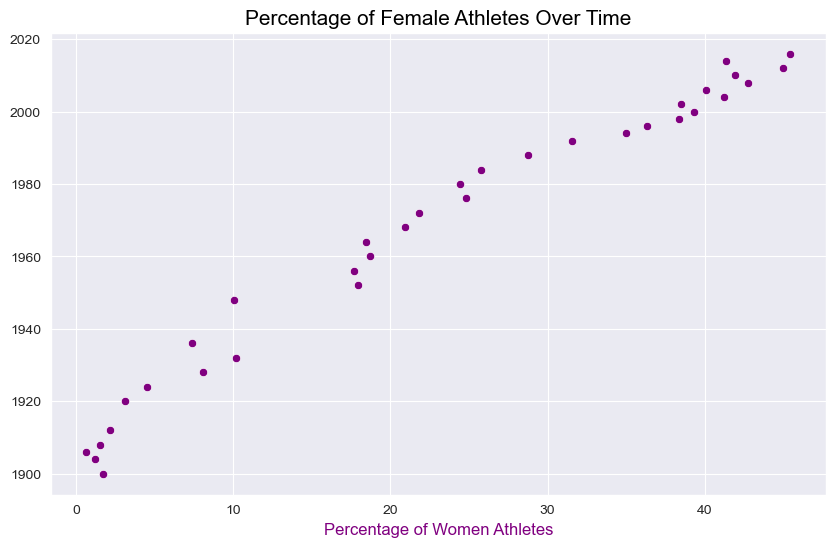

In [34]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=percentage_of_female_athletes_over_time, x="Percentage", y="Year",
                color="purple")
plt.title("Percentage of Female Athletes Over Time",
          color="black",
          fontsize=15)
plt.ylabel("") 
plt.xlabel("Percentage of Women Athletes", 
           color="purple") 
print("The scatter plot displays how the percentage of women athletes has gradually increased over time.") 

2) Compare and contrast the summer and the winter games...

    a) How many athletes compete?

In [35]:
number_of_athletes_competing_by_games = athlete_events.groupby("Season")["ID"].count().reset_index()
number_of_athletes_competing_by_games = number_of_athletes_competing_by_games.rename(columns={"ID": "Number of Athletes Competing"})
number_of_athletes_competing_by_games

,Season,Number of Athletes Competing
0,Summer,221167
1,Winter,48564


###### **Barplot of number of athletes by Games**

The number of summer games vs winter games athletes


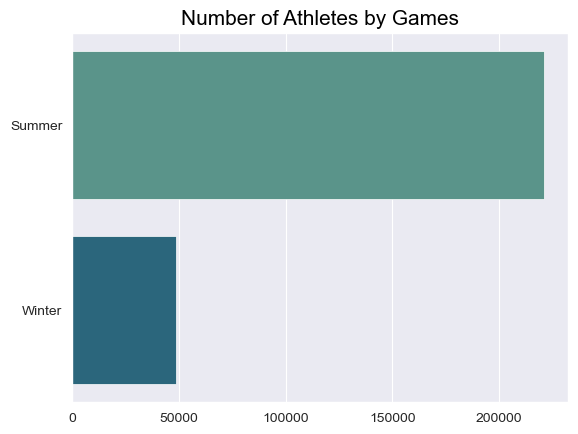

In [36]:
sns.barplot(data=number_of_athletes_competing_by_games,
            x="Number of Athletes Competing", 
            y="Season",
            palette="crest") 
plt.title("Number of Athletes by Games",
          color="black",
          fontsize=15)
plt.ylabel("") 
plt.xlabel("") 
print(f"The number of summer games vs winter games athletes")

Now I will look at the percentage of the number of athletes per Games

###### **Percentage of number of athletes per Games**

82% of all athletes compete in the Summer Games, while 18% of all athletes compete in the Winter Games.


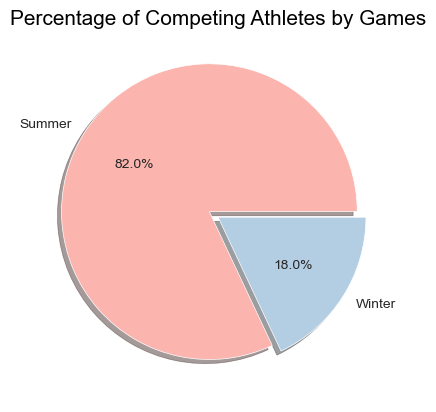

In [37]:
e = [0.07, 0]
c = sns.color_palette("Pastel1")
plt.pie(number_of_athletes_competing_by_games["Number of Athletes Competing"],
        labels=number_of_athletes_competing_by_games["Season"],
        autopct="%0.1f%%",
        shadow=True,
        explode=e,
        colors=c) 
plt.title("Percentage of Competing Athletes by Games",
          color="black",
          fontsize=15)
print(f"82% of all athletes compete in the Summer Games, while 18% of all athletes compete in the Winter Games.") 

b) How many countries compete?

To answer this, I will first join the 'athlete_events' and 'country_definitions' dataframes into a dataframe named 'athlete_events_country'. The merging of these dataframes will allow me to acquire the region information when performing analysis.

###### **Joining 'athlete_events' and 'country_definitions' dfs**

In [38]:
athlete_events_country = pd.merge(athlete_events, country_definitions, how="inner", on="NOC")
athlete_events_country.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,Height Feet/Inches,Weight Pounds,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No Medal,5.9,176,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No Medal,5.6,132,China,NaN
2,602,Abudoureheman,M,22.0,182.0,75.0,China,CHN,2000 Summer,2000,Summer,Sydney,Boxing,Boxing Men's Middleweight,No Medal,6.0,165,China,NaN
3,1463,Ai Linuer,M,25.0,160.0,62.0,China,CHN,2004 Summer,2004,Summer,Athina,Wrestling,"Wrestling Men's Lightweight, Greco-Roman",No Medal,5.2,136,China,NaN
4,1464,Ai Yanhan,F,14.0,168.0,54.0,China,CHN,2016 Summer,2016,Summer,Rio de Janeiro,Swimming,Swimming Women's 200 metres Freestyle,No Medal,5.5,119,China,NaN


In [39]:
number_of_competing_countries = athlete_events_country.groupby("Season")["region"].nunique().reset_index()
number_of_competing_countries = number_of_competing_countries.rename(columns={"region": "Number of Countries"})
number_of_competing_countries

,Season,Number of Countries
0,Summer,205
1,Winter,111


The bar graphs shows that there are more countries participating in the Summer Games than there is in the Winter Games.


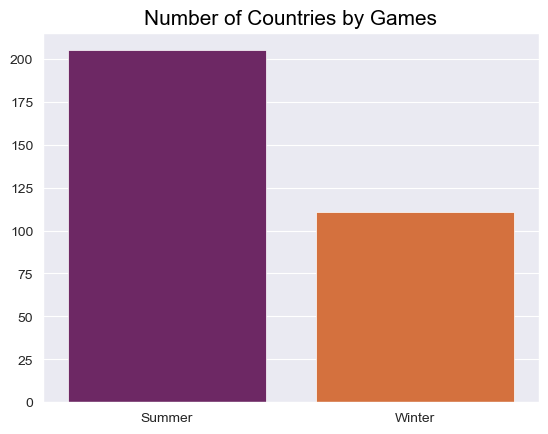

In [40]:
sns.barplot(data=number_of_competing_countries, 
            y="Number of Countries",
            x="Season",
            palette="inferno")
plt.title("Number of Countries by Games",
          color="black",
          fontsize=15)
plt.ylabel("") 
plt.xlabel("") 
print(f"The bar graphs shows that there are more countries participating in the Summer Games than there is in the Winter Games.") 

More countries participate in the Summer Games than in the Winter Games


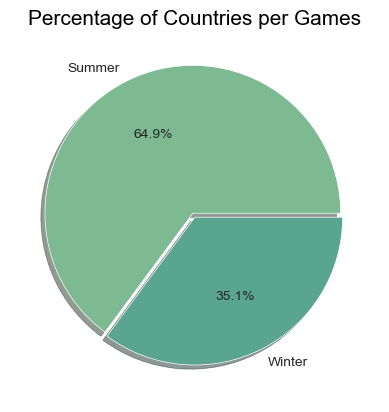

In [41]:
c = sns.color_palette("crest")
e = [0.03, 0]
plt.pie(number_of_competing_countries["Number of Countries"],
        labels=number_of_competing_countries["Season"],
        autopct="%.1f%%",
        shadow=True,
        explode=e,
        colors=c)
plt.title("Percentage of Countries per Games",
          color="black",
          fontsize=15)
print("More countries participate in the Summer Games than in the Winter Games")

c) How many events are there?

In [42]:
number_of_events = athlete_events_country.groupby("Season")["Event"].nunique().reset_index()
number_of_events = number_of_events.rename(columns={"Event": "Number of Events"})
number_of_events


,Season,Number of Events
0,Summer,651
1,Winter,119


The bar graph displays the number of events by Games.


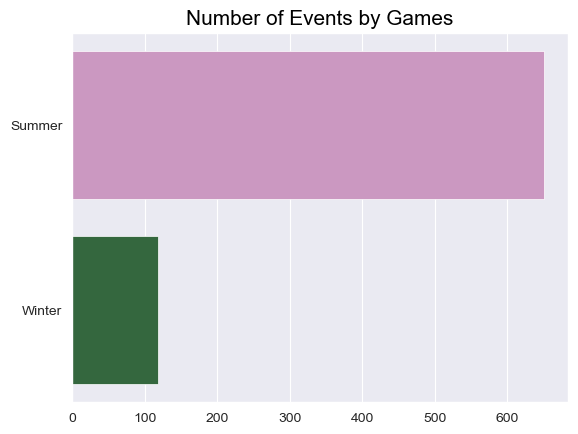

In [43]:
sns.barplot(data=number_of_events,
            y="Season",
            x="Number of Events",
            palette ="cubehelix_r")
plt.title("Number of Events by Games",
          color="black",
          fontsize=15)
plt.ylabel("")
plt.xlabel("") 
print("The bar graph displays the number of events by Games.") 

The Summer Games hold 84.5% of the events.


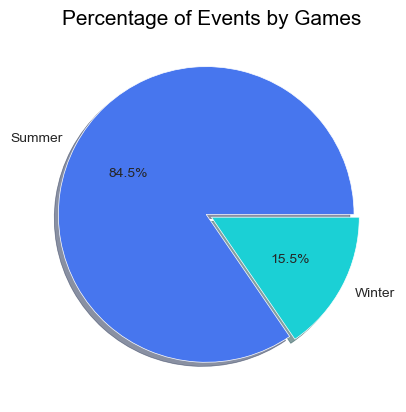

In [44]:
c = sns.color_palette("turbo")
e = [0.04, 0]
plt.pie(number_of_events["Number of Events"],
        labels=number_of_events["Season"],
        autopct="%.1f%%",
        shadow=True,
        explode=e,
        colors=c)
plt.title("Percentage of Events by Games",
          color="black",
          fontsize=15)
print("The Summer Games hold 84.5% of the events.") 


3) Analyze and visualize country-level trends...

    a) Which countries send the most athletes to the olympics?

    For this question, I will begin by storing the value of the grouped region column by the count of the unique id column in a dataframe named 'most_athletes_to_olympics_by_country'. I will then rename the region column as 'Country', and the ID column as 'Number of Athletes'. Then I will look at the top 10 countries that send the most athletes to the olympics.

    ###### **Top 10 countries to send the most athletes to the olympics**

In [45]:
most_athletes_to_olympics_by_country = athlete_events_country.groupby("region")["ID"].count().reset_index()
most_athletes_to_olympics_by_country = most_athletes_to_olympics_by_country.rename(columns={"region": "Country", "ID": "Number of Athletes"}).sort_values(by="Number of Athletes", ascending=False).reset_index()
most_athletes_to_olympics_by_country[:10]

,index,Country,Number of Athletes
0,191,USA,18604
1,67,Germany,15787
2,63,France,12551
3,190,UK,12115
4,151,Russia,11692
5,87,Italy,10668
6,33,Canada,9681
7,90,Japan,8424
8,176,Sweden,8291
9,10,Australia,7723


The bar graph indicates that America has sent the most athlets to the olympics.


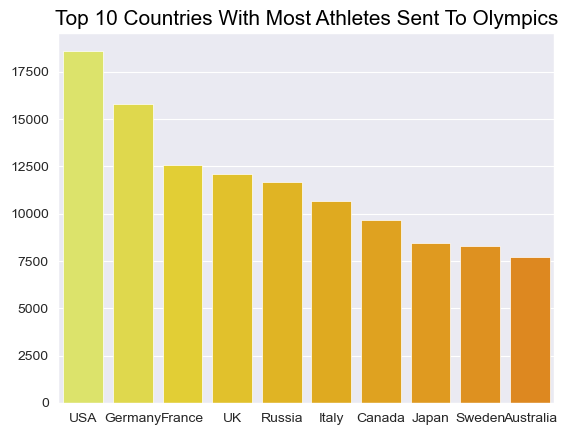

In [46]:
top_10_most_athletes_to_olympics_by_country = most_athletes_to_olympics_by_country[:10]
sns.barplot(data=top_10_most_athletes_to_olympics_by_country,
            x="Country",
            y="Number of Athletes",
            palette="Wistia")
plt.title("Top 10 Countries With Most Athletes Sent To Olympics",
          color="black",
          fontsize=15)
plt.ylabel("") 
plt.xlabel("") 
print("The bar graph indicates that America has sent the most athlets to the olympics.")

b) Do they also tend to win the most medals?

I will answer this question by storing the values of the grouped region and Medal columns by the count of the ID  and Medal columns in a dataframe named 'most_medals'. Then I will rename the count of the ID and Medal columns to 'Num_of_Athletes' and 'Number_of_Medals' and then sort the values in descending order. Lastly, I will use this dataframe to find top 10 countries with the most Gold, Bronze, and Silver medals, and create visuals for them.

###### **Creating 'most_medals' df**

In [47]:
most_medals = athlete_events_country.groupby(["region", "Medal"]).agg(Num_of_Athletes=("ID", "count"), Number_of_Medals=("Medal", "count"))
most_medals = most_medals.sort_values(by="Number_of_Medals", ascending=False)

###### **Top 10 countries with the most gold medals**

In [48]:
most_gold_medals_by_country = most_medals.sort_values(by="Number_of_Medals", ascending=False).reset_index()
most_gold_medals_by_country = most_gold_medals_by_country[most_gold_medals_by_country["Medal"] == "Gold"].reset_index()
del most_gold_medals_by_country["Num_of_Athletes"]
most_gold_medals_by_country[:10]

,index,region,Medal,Number_of_Medals
0,30,USA,Gold,2638
1,36,Russia,Gold,1599
2,42,Germany,Gold,1301
3,68,UK,Gold,677
4,77,Italy,Gold,575
5,89,France,Gold,499
6,90,Sweden,Gold,479
7,91,Canada,Gold,463
8,98,Hungary,Gold,432
9,102,Norway,Gold,378


###### **Top 10 countries with the most bronze silver medals**

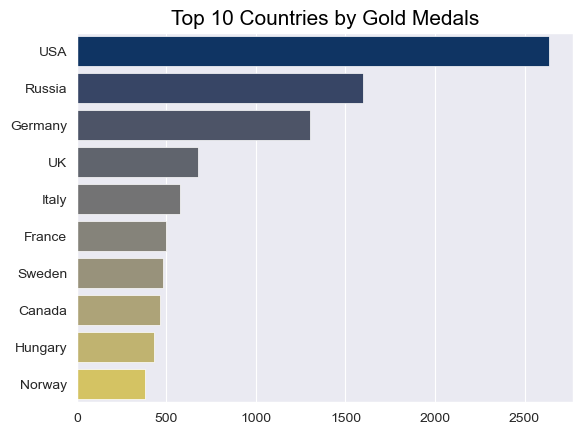

In [49]:
top_10_countries_by_gold_medals = most_gold_medals_by_country[:10]
sns.barplot(data=top_10_countries_by_gold_medals,
            x="Number_of_Medals",
            y="region",
            palette="cividis")
plt.title("Top 10 Countries by Gold Medals",
          color="black",
          fontsize=15)
plt.ylabel("") 
plt.xlabel("") 
print()

In [50]:
most_silver_medals_by_country = most_medals.sort_values(by="Number_of_Medals", ascending=False).reset_index()
most_silver_medals_by_country = most_silver_medals_by_country[most_silver_medals_by_country["Medal"] == "Silver"].reset_index()
del most_silver_medals_by_country["Num_of_Athletes"]
most_silver_medals_by_country[:10]

,index,region,Medal,Number_of_Medals
0,35,USA,Silver,1641
1,47,Germany,Silver,1195
2,49,Russia,Silver,1170
3,62,UK,Silver,739
4,75,France,Silver,602
5,83,Italy,Silver,531
6,86,Sweden,Silver,522
7,93,Australia,Silver,459
8,96,Canada,Silver,438
9,106,Norway,Silver,361


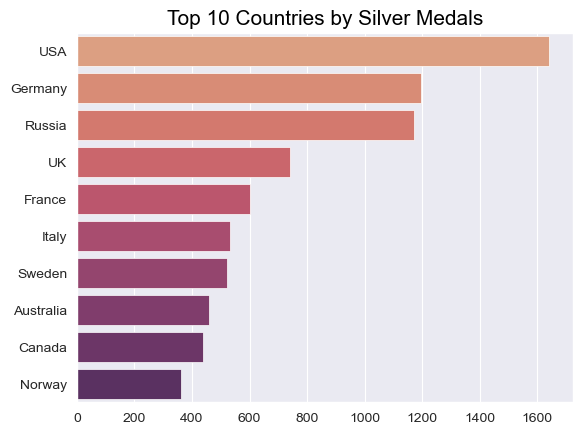

In [51]:
top_10_countries_by_silver_medals = most_silver_medals_by_country[:10]
sns.barplot(data=top_10_countries_by_silver_medals,
            x="Number_of_Medals",
            y="region",
            palette="flare")
plt.title("Top 10 Countries by Silver Medals",
          color="black",
          fontsize=15)
plt.ylabel("") 
plt.xlabel("") 
print()

###### **Top 10 countries with the most bronze medals**

In [52]:
most_bronze_medals_by_country = most_medals.sort_values(by="Number_of_Medals", ascending=False).reset_index()
most_bronze_medals_by_country = most_bronze_medals_by_country[most_bronze_medals_by_country["Medal"] == "Bronze"].reset_index()
del most_bronze_medals_by_country["Num_of_Athletes"]
most_bronze_medals_by_country[:10]

,index,region,Medal,Number_of_Medals
0,40,USA,Bronze,1358
1,45,Germany,Bronze,1260
2,48,Russia,Bronze,1178
3,69,France,Bronze,666
4,73,UK,Bronze,651
5,80,Sweden,Bronze,535
6,82,Italy,Bronze,531
7,85,Australia,Bronze,522
8,94,Canada,Bronze,451
9,97,Finland,Bronze,432


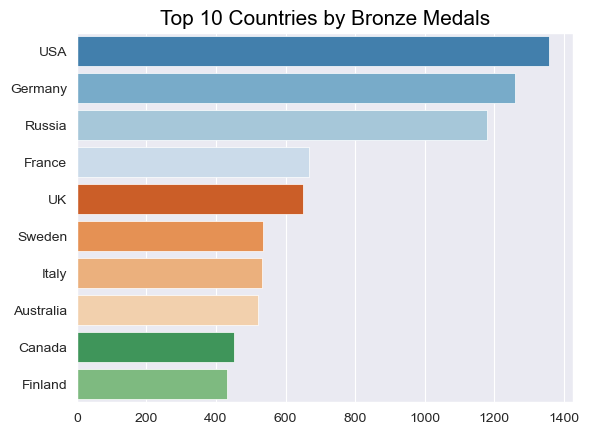

In [53]:
top_10_countries_by_bronze_medals = most_bronze_medals_by_country[:10]
sns.barplot(data=top_10_countries_by_bronze_medals,
            x="Number_of_Medals",
            y="region",
            palette="tab20c")
plt.title("Top 10 Countries by Bronze Medals",
          fontsize=15,
          color="black")
plt.ylabel("") 
plt.xlabel("") 
print()

Out of the top 10 countries that have participated in the most olympic games, they have also consistently won the most gold, silver, and bronze medals. This corelation is strongest amongst the USA, Germany, and Russia.

c) How have these trends changed over time?

To tackle this question, I created a dataframe named 'most_athletes_to_olympics_by_country_year_trend' with the value of the region and Year columns grouped by the count of the ID column. I then renamed the ID and region columns 'Number of Athletes' and 'Country'. Finally, I filtered the dataframe by year so in order to see the trends of the number of olympic countries over time, the year can be updated for comparing other years.

In [69]:
most_athletes_to_olympics_by_country_year_trend = athlete_events_country.groupby(["region", "Year"])["ID"].count().reset_index()
most_athletes_to_olympics_by_country_year_trend = most_athletes_to_olympics_by_country_year_trend.rename(columns={"ID": "Number of Athletes", "region": "Country"})
most_athletes_to_olympics_by_country_year_trend = most_athletes_to_olympics_by_country_year_trend[most_athletes_to_olympics_by_country_year_trend["Year"] == 1936]  # alter the year to see the trend
most_athletes_to_olympics_by_country_year_trend

,Country,Year,Number of Athletes
0,Afghanistan,1936,16
91,Argentina,1936,68
146,Australia,1936,42
180,Austria,1936,414
282,Belgium,1936,218
330,Bermuda,1936,9
363,Boliva,1936,2
406,Brazil,1936,94
439,Bulgaria,1936,95
512,Canada,1936,205
